# Final Project

name: Jiayi Guo

email: jiayiguo@umich.edu

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Epoch 1/5
Batch 0, Loss: 13.299221992492676


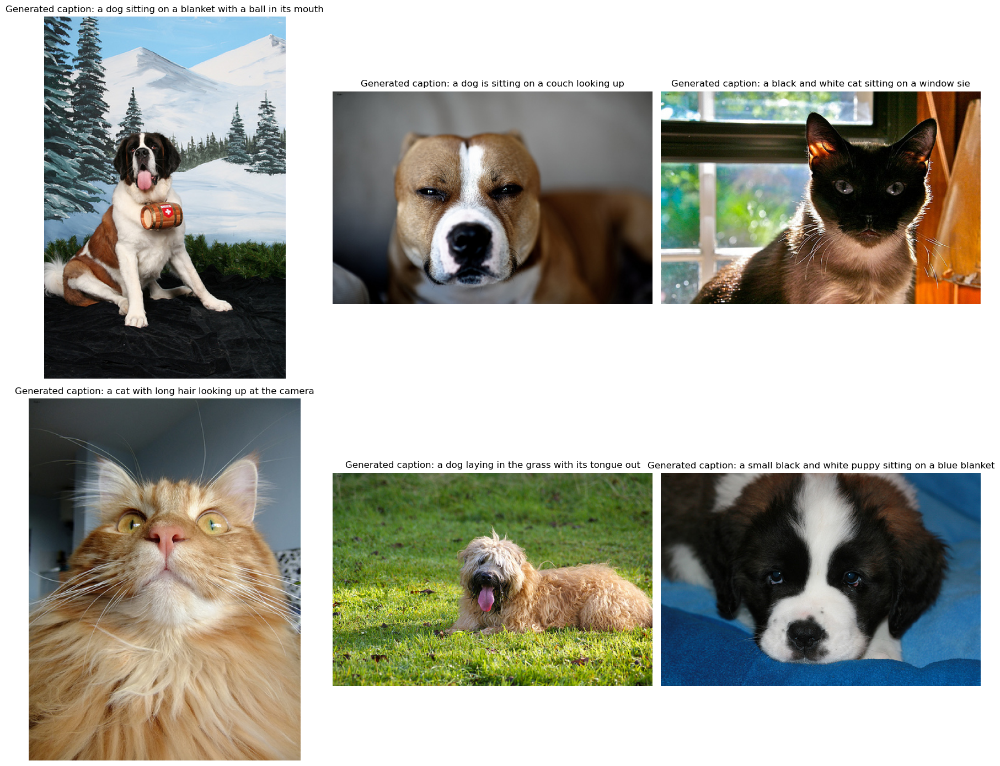

Epoch 2/5
Batch 0, Loss: 10.378581047058105


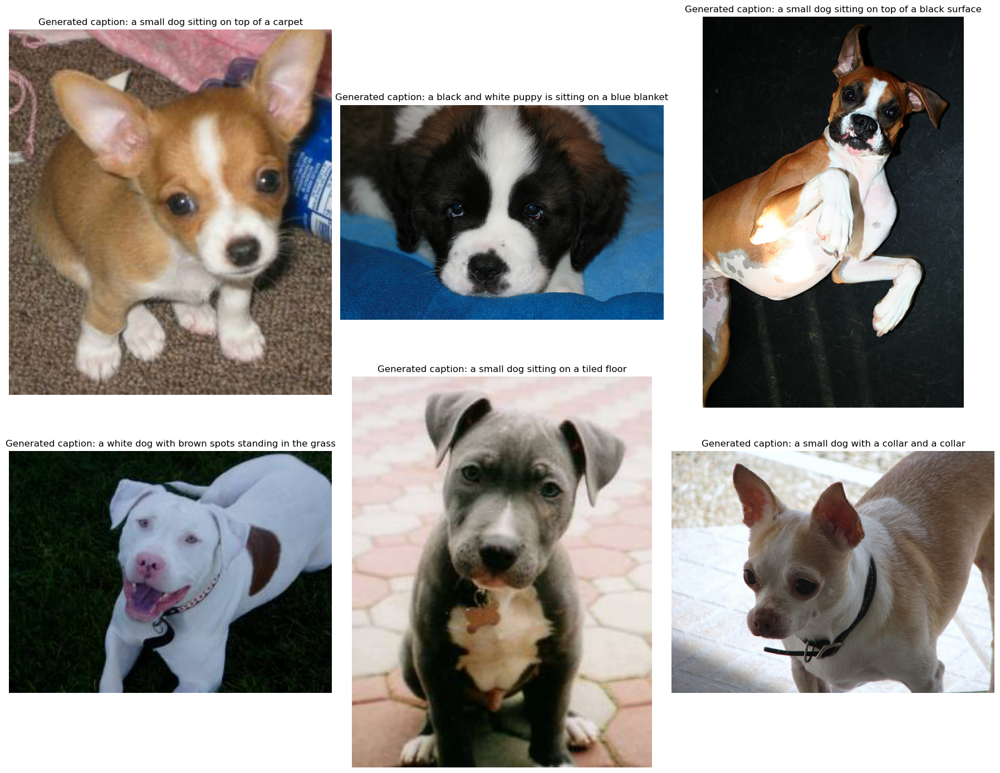

Epoch 3/5
Batch 0, Loss: 10.320682525634766


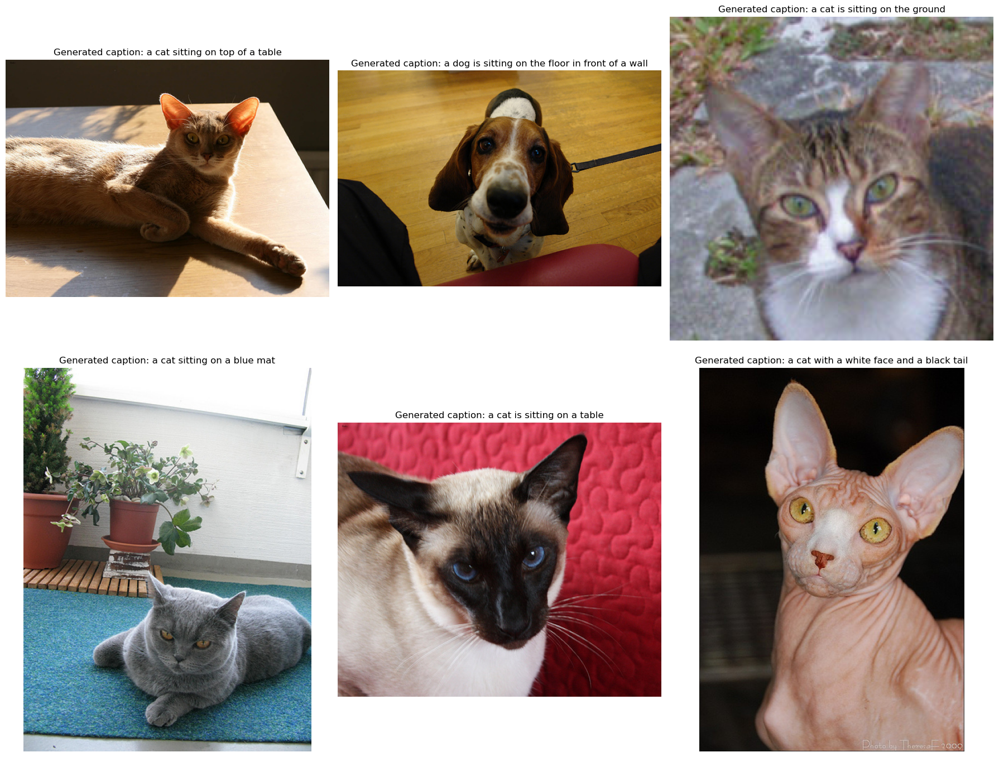

Epoch 4/5
Batch 0, Loss: 10.2820405960083


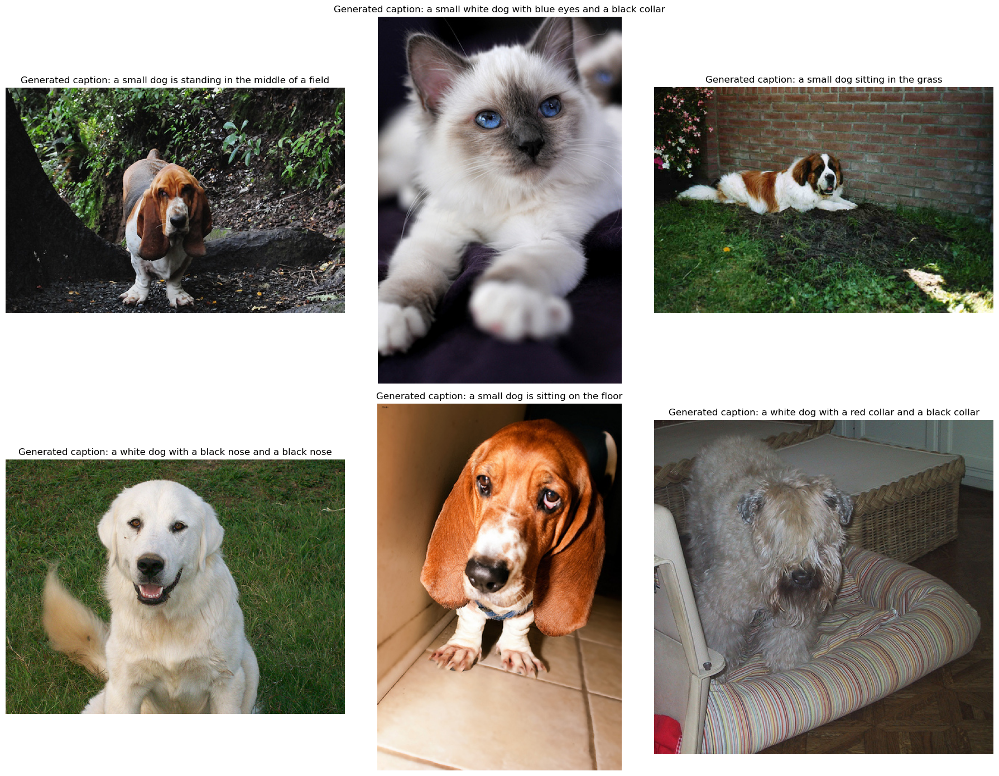

Epoch 5/5
Batch 0, Loss: 10.223722457885742


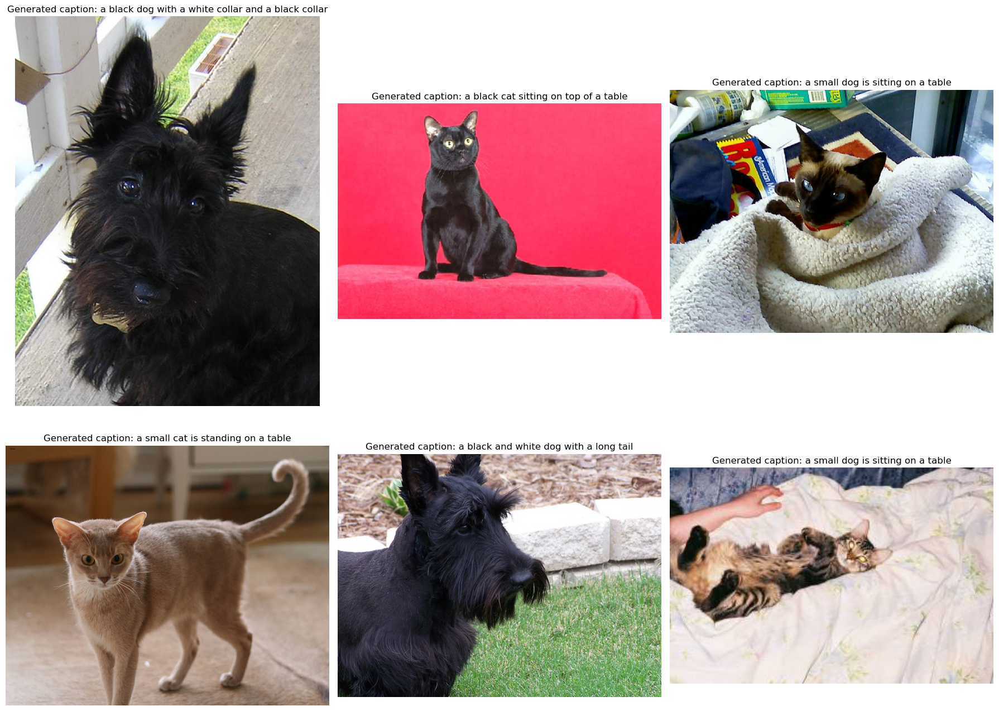

In [3]:
from datasets import Dataset
from PIL import Image
import os
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
from transformers import BlipProcessor, BlipForConditionalGeneration
from torch.optim import AdamW
import random


image_dir = "/Users/jiayiguo/Desktop/UMich/Fall24/STATS507/Final_Project/oxford-iiit-pet/images"
annotations = "/Users/jiayiguo/Desktop/UMich/Fall24/STATS507/Final_Project/oxford-iiit-pet/annotations/trainval.txt"

def load_image_label(line):
    components = line.strip().split()
    
    image_id = components[0]
    species = int(components[1])  # 1 is cat, 2 is dog
    breed_id = int(components[2])
    category = int(components[3])
    image_path = os.path.join(image_dir, image_id + ".jpg")
    
    try:
        image = Image.open(image_path).convert("RGB")
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None
    
    label = {
        "species": species,
        "breed_id": breed_id,
        "category": category,
        "image_id": image_id,
        "caption": components[4:]
    }
    
    return {"image": image, "label": label}
dataset_dict = []
with open(annotations, "r") as file:
    for line in file.readlines():
        result = load_image_label(line)
        if result:
            dataset_dict.append(result)

#randomly select 500 images from the dataset for faster training
random_indices = random.sample(range(len(dataset_dict)), 500)
selected_dataset = [dataset_dict[i] for i in random_indices]

# Convert dataset to Hugging Face format
dataset = Dataset.from_dict({
    "image": [item["image"] for item in selected_dataset],
    "label": [item["label"] for item in selected_dataset]
})

#Transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
])
for idx in range(len(dataset)):
    dataset[idx]["image"] = transform(dataset[idx]["image"])

# BLIP model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

def collate_fn(batch):
    images = [item["image"] for item in batch]
    labels = [item["label"] for item in batch]
    return {"images": images, "labels": labels}

#dataLoader
train_dataloader = DataLoader(dataset, batch_size=5, shuffle=True, collate_fn=collate_fn)

# Optimizer
optimizer = AdamW(model.parameters(), lr=5e-5)

# Train loop
model.train()
for epoch in range(5):
    print(f"Epoch {epoch + 1}/5")
    fig = plt.figure(figsize=(18, 14))
    
    captions_list = []
    num_images_displayed = 0
    
    for idx, batch in enumerate(train_dataloader):
        images = batch["images"]
        labels = batch["labels"]
        
        inputs = processor(images=images, return_tensors="pt").to(device)
    
        truth_captions = [" ".join(label["caption"]) for label in labels]
        text_inputs = processor.tokenizer(truth_captions, padding="max_length", truncation=True, return_tensors="pt")
        input_ids = text_inputs.input_ids.to(device)
        outputs = model(pixel_values=inputs["pixel_values"], input_ids=input_ids, labels=input_ids)
        loss = outputs.loss
        
        #Backpropagate the loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if idx % 10 == 0:
            print(f"Batch {idx}, Loss: {loss.item()}")
        with torch.no_grad():
            generated_ids = model.generate(pixel_values=inputs["pixel_values"], max_length=50)
            generated_captions = processor.batch_decode(generated_ids, skip_special_tokens=True)
        
        for i, image in enumerate(images):
            caption = generated_captions[i]
            captions_list.append((image, f"Generated caption: {caption}"))
            num_images_displayed += 1
            
            if num_images_displayed >= 6:
                break
        
        if num_images_displayed >= 6:
            break

    for idx, (image, caption) in enumerate(captions_list):
        ax = fig.add_subplot(2, 3, idx + 1)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(caption)

    plt.tight_layout()
    plt.show()
    torch.save(model.state_dict(), f"blip_model_epoch_{epoch + 1}.pt")
    captions_list.clear()

torch.save(model.state_dict(), "blip_model_final.pt")
